### Feature Engineering: Time-Based Feature Extraction

<div style="background-color:#f3e5f5; padding: 20px; border-radius: 10px; border-left: 6px solid #ab47bc; font-size: 16px">
<div style="text-align: center; font-weight: bold">

“Feature engineering is the art of turning data into signals.”  
<span style="font-style: italic;">— Anonymous</span>

</div>

In this notebook, we transition from general preprocessing to <strong>focused feature engineering</strong>, where we extract meaningful <strong>time-based features</strong> from the <code>datetime</code> column and perform an exploratory data analysis (EDA) to visualize and understand their impact on our target variable, <code>Hourly Demand Met (in MW)</code>.

These engineered features will help uncover hidden patterns and improve model performance, especially in time-influenced energy consumption scenarios.
</div>


#### Importing libraries and packages

In [1]:
# Basic libraries
import numpy as np
import pandas as pd

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

# For displaying visuals nicely in notebook
from IPython.display import display

# To ignore warnings
import warnings
warnings.filterwarnings("ignore")

# For datetime handling if needed
import datetime


#### Load the cleaned dataset

In [2]:
# Load cleaned dataset
df = pd.read_csv("cleaned_data.csv")

# Preview
df.head()

,Hourly Demand Met (in MW),datetime,temp,dew,humidity,windgust,windspeed,sealevelpressure,cloudcover,visibility,solarradiation,uvindex,winddir_sin,winddir_cos
0,138212.80,2023-01-01 00:00:00,11.0,10.0,93.55,2.639057,1.856298,1020.0,0.0,1.098612,0.0,0.0,-0.939693,-3.420201e-01
1,134620.74,2023-01-01 01:00:00,10.0,9.0,93.50,2.660260,1.856298,1020.0,0.0,1.098612,0.0,0.0,-0.939693,-3.420201e-01
2,131384.79,2023-01-01 02:00:00,8.6,7.6,93.83,2.660260,0.000000,1019.5,0.0,0.788457,0.0,0.0,-0.977783,2.096186e-01
3,130602.47,2023-01-01 03:00:00,10.0,9.0,93.50,2.687847,0.000000,1019.0,0.0,1.098612,0.0,0.0,0.000000,1.000000e+00
4,133288.97,2023-01-01 04:00:00,9.0,9.0,100.00,2.580217,1.856298,1019.0,0.0,0.693147,0.0,0.0,-1.000000,-1.836970e-16


#### Extract Time-Based Features

In [3]:
# Ensure datetime column is in correct format
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# Check if conversion worked
print(df['datetime'].dtypes)

# Extracting useful time-based features
df['hour'] = df['datetime'].dt.hour
df['dayofweek'] = df['datetime'].dt.dayofweek
df['quarter'] = df['datetime'].dt.quarter
df['month'] = df['datetime'].dt.month
df['year'] = df['datetime'].dt.year
df['dayofyear'] = df['datetime'].dt.dayofyear
df['dayofmonth'] = df['datetime'].dt.day
df['weekofyear'] = df['datetime'].dt.isocalendar().week.astype(int)  # Use of isocalendar for compatibility


datetime64[ns]


Note: We are retaining the original datetime column for now since it will be used for plotting and further lag/rolling operations.

In [4]:
# Define the seasons
season_map = {
    12: 'Winter',1: 'Winter', 2: 'Winter',  # Winter months
    3: 'Spring', 4: 'Spring', 5: 'Spring',  # Spring months
    6: 'Summer', 7: 'Summer', 8: 'Summer',  # Summer months
    9: 'Fall',  10: 'Fall',  11: 'Fall'     # Fall months
}

# Create the season column based on the month
df['season'] = df['month'].map(season_map)

# Check the newly created season column
print(df[['month', 'season']].head(50))

    month  season
0       1  Winter
1       1  Winter
2       1  Winter
3       1  Winter
4       1  Winter
5       1  Winter
6       1  Winter
7       1  Winter
8       1  Winter
9       1  Winter
10      1  Winter
11      1  Winter
12      1  Winter
13      1  Winter
14      1  Winter
15      1  Winter
16      1  Winter
17      1  Winter
18      1  Winter
19      1  Winter
20      1  Winter
21      1  Winter
22      1  Winter
23      1  Winter
24      1  Winter
25      1  Winter
26      1  Winter
27      1  Winter
28      1  Winter
29      1  Winter
30      1  Winter
31      1  Winter
32      1  Winter
33      1  Winter
34      1  Winter
35      1  Winter
36      1  Winter
37      1  Winter
38      1  Winter
39      1  Winter
40      1  Winter
41      1  Winter
42      1  Winter
43      1  Winter
44      1  Winter
45      1  Winter
46      1  Winter
47      1  Winter
48      1  Winter
49      1  Winter


In [5]:
df.head()

,Hourly Demand Met (in MW),datetime,temp,dew,humidity,windgust,windspeed,sealevelpressure,cloudcover,visibility,...,winddir_cos,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,season
0,138212.80,2023-01-01 00:00:00,11.0,10.0,93.55,2.639057,1.856298,1020.0,0.0,1.098612,...,-3.420201e-01,0,6,1,1,2023,1,1,52,Winter
1,134620.74,2023-01-01 01:00:00,10.0,9.0,93.50,2.660260,1.856298,1020.0,0.0,1.098612,...,-3.420201e-01,1,6,1,1,2023,1,1,52,Winter
2,131384.79,2023-01-01 02:00:00,8.6,7.6,93.83,2.660260,0.000000,1019.5,0.0,0.788457,...,2.096186e-01,2,6,1,1,2023,1,1,52,Winter
3,130602.47,2023-01-01 03:00:00,10.0,9.0,93.50,2.687847,0.000000,1019.0,0.0,1.098612,...,1.000000e+00,3,6,1,1,2023,1,1,52,Winter
4,133288.97,2023-01-01 04:00:00,9.0,9.0,100.00,2.580217,1.856298,1019.0,0.0,0.693147,...,-1.836970e-16,4,6,1,1,2023,1,1,52,Winter


<div style="text-align: center; background-color: #f3e5f5; padding: 20px; border-radius: 12px; font-size: 24px; font-weight: bold;">
    Exploratory Data Analysis of Time-Based Features ⏳📊
</div>


#### 1. Time-Series Plot of Hourly Demand Met Over Time

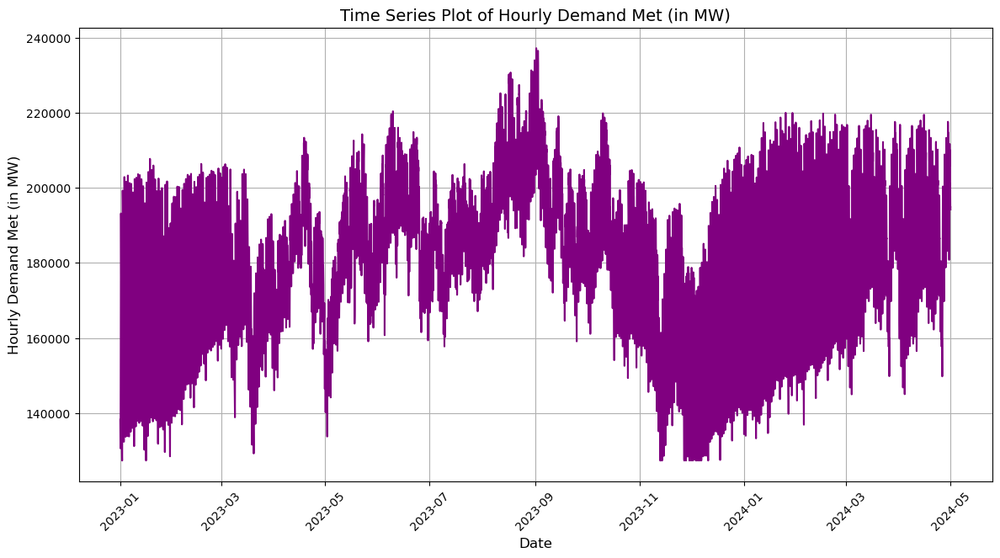

In [6]:
# Time Series Plot for Hourly Demand Met
plt.figure(figsize=(14, 7))
sns.lineplot(x='datetime', y='Hourly Demand Met (in MW)', data=df, color='purple')
plt.title('Time Series Plot of Hourly Demand Met (in MW)', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Hourly Demand Met (in MW)', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

The time series plot shows clear seasonality in hourly energy demand:

- Peak demand during summer (June–September) due to high cooling needs.
- Lowest demand in winter (Dec–Jan), likely due to colder temperatures and holidays.
- Strong short-term fluctuations suggest real-time variability.
- Overall trend forms a cyclical pattern, indicating the importance of season-based features in modeling.

#### 2. Hourly Analysis
#### 2.1 Barplot of Average Demand by Hour

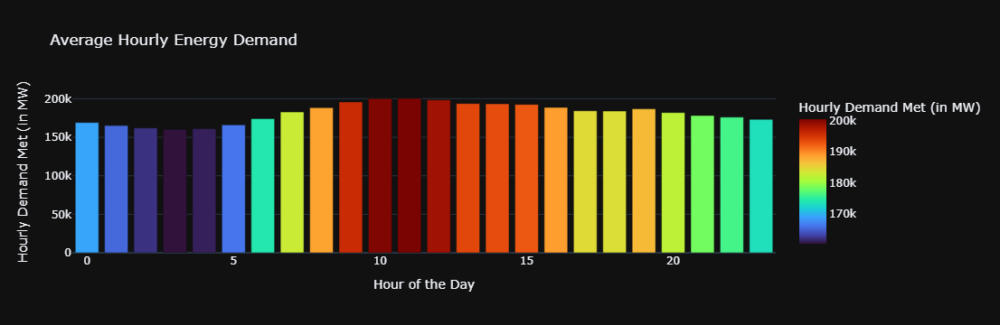

In [7]:
hourly_avg = df.groupby('hour')['Hourly Demand Met (in MW)'].mean().reset_index()

fig = px.bar(hourly_avg,
             x='hour',
             y='Hourly Demand Met (in MW)',
             color='Hourly Demand Met (in MW)',
             color_continuous_scale='Turbo',
             title='Average Hourly Energy Demand',
             labels={'hour': 'Hour of the Day'},
             height=500)

fig.update_layout(template='plotly_dark', plot_bgcolor='rgba(0,0,0,0)')
fig.show()


#### Insights drawn from the plot:
1. <span style="font-weight:600;">Morning Surge:</span> Energy demand increases rapidly from 6 AM, peaking around 10–11 AM. This aligns with workday beginnings and industrial/commercial operations.
2. <span style="font-weight:600;">Peak Demand Hours:</span> 10 AM to 1 PM shows the highest demand, reaching nearly 200k MW. It indicates intense energy usage during late mornings.
3. <span style="font-weight:600;">Evening Stability:</span> Demand gradually decreases post-lunch but remains fairly stable till 8 PM. It suggests consistent residential and commercial use.
4. <span style="font-weight:600;">Nighttime Dip:</span> After 9 PM, demand drops noticeably, reaching the lowest levels around 3–5 AM. It reflects lower activity and sleeping hours.

#### 2.2 Boxplot of Energy Demand by Hour

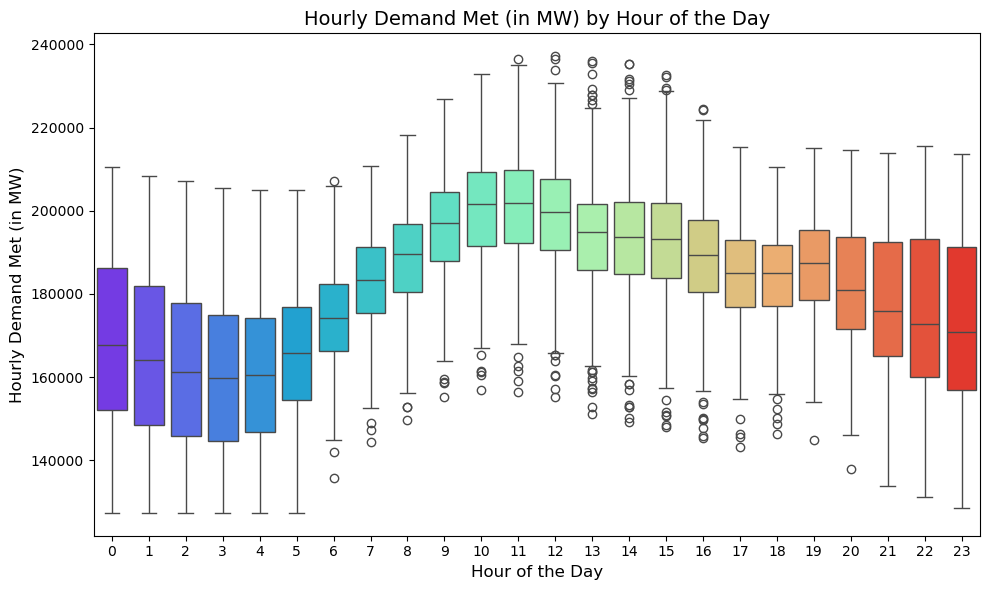

In [8]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='hour', y='Hourly Demand Met (in MW)', data=df, palette="rainbow")
plt.title('Hourly Demand Met (in MW) by Hour of the Day', fontsize=14)
plt.xlabel('Hour of the Day', fontsize=12)
plt.ylabel('Hourly Demand Met (in MW)', fontsize=12)
plt.tight_layout()
plt.show()


#### Insights:

- Peak demand occurs between 10 AM to 2 PM, with high and stable energy usage. These hours also show a tighter IQR (Interquartile Range), indicating more consistent demand during peak periods.
- Lowest demand is seen during 2 AM to 5 AM, reflecting reduced activity during nighttime.
- Variability is higher in early morning and late evening hours, suggesting unpredictable demand fluctuations.
- the higher number of outliers during 6 AM to 8 PM reflects greater fluctuation in energy demand during the day.

#### 3. Daily and Weekly Analysis
#### 3.1 Boxplot of Energy Demand by Day of Week

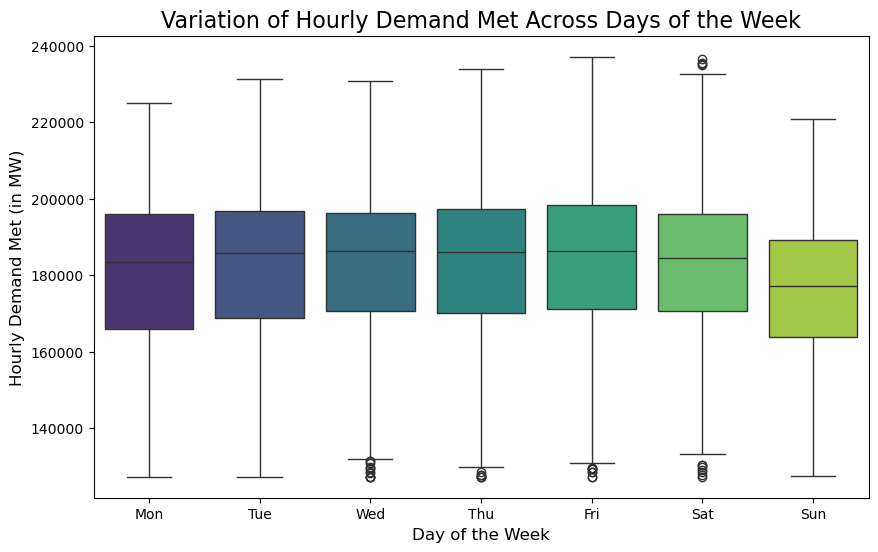

In [9]:
# Plotting Hourly Demand Met across Days of the Week
plt.figure(figsize=(10, 6))
sns.boxplot(data = df, x='dayofweek', y='Hourly Demand Met (in MW)', palette="viridis")

# Setting labels and title
plt.title("Variation of Hourly Demand Met Across Days of the Week", fontsize=16)
plt.xlabel("Day of the Week", fontsize=12)
plt.ylabel("Hourly Demand Met (in MW)", fontsize=12)
plt.xticks(ticks=range(7), labels=["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"])

plt.show()


#### Insights:
- Weekdays (Mon–Fri) show relatively higher and more consistent energy demand with slightly higher medians.
- Weekends (Sat–Sun) have more variability and lower median demand, likely due to reduced industrial and commercial activity.
- Sunday shows the lowest median and the widest spread, indicating diverse usage patterns among consumers.
- Slightly more outliers on Wed–Sat, possibly due to fluctuating off-peak or transitional periods.

Electricity demand is higher and more consistent on working days, while weekends have lower and more scattered demand, hinting at reduced industrial activity and more irregular residential patterns.

#### 3.2 Line Plot for Average Demand by Day of Week

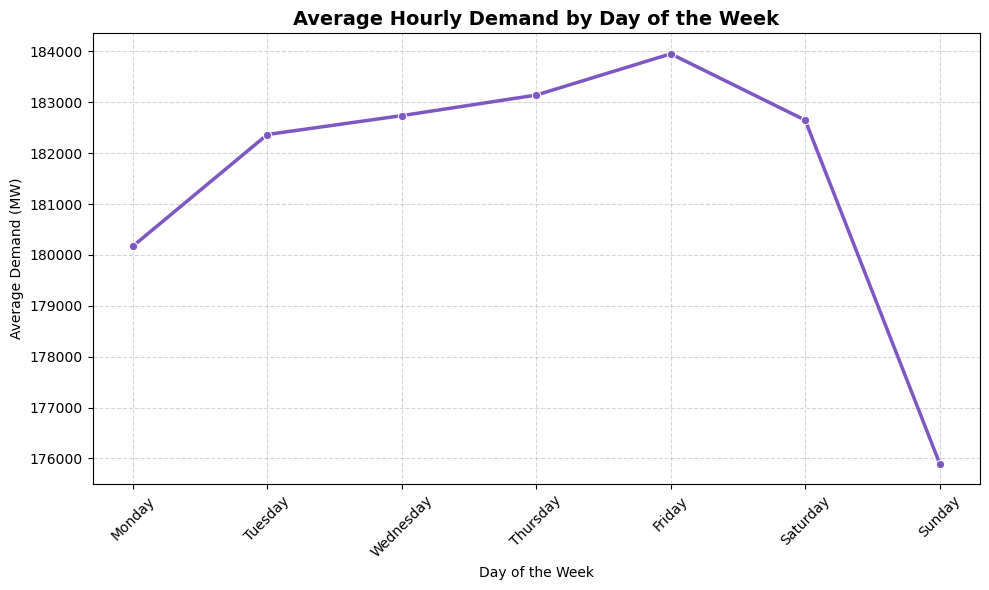

In [10]:
# Calculate average demand per day of the week
avg_demand_by_day = df.groupby('dayofweek')['Hourly Demand Met (in MW)'].mean().reset_index()

# Mapping numeric day to actual day names
day_map = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 
           4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
avg_demand_by_day['dayofweek'] = avg_demand_by_day['dayofweek'].map(day_map)

# Sort by actual weekday order
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
avg_demand_by_day = avg_demand_by_day.set_index('dayofweek').loc[ordered_days].reset_index()

# Plotting
plt.figure(figsize=(10,6))
sns.lineplot(data=avg_demand_by_day, x='dayofweek', y='Hourly Demand Met (in MW)', marker='o', linewidth=2.5, color='#7E57C2')
plt.title('Average Hourly Demand by Day of the Week', fontsize=14, weight='bold')
plt.xlabel('Day of the Week')
plt.ylabel('Average Demand (MW)')
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


#### 3.3 Heatmap: Hourly Demand by Day of Week

In [11]:
import numpy as np
heatmap_data = df.groupby(['dayofweek', 'hour'])['Hourly Demand Met (in MW)'].mean().unstack()

fig = go.Figure(data=go.Heatmap(
    z=heatmap_data.values,
    x=heatmap_data.columns,
    y=['Mon','Tue','Wed','Thu','Fri','Sat','Sun'],
    colorscale='YlGnBu',
    colorbar_title='Avg Demand (MW)'
))

fig.update_layout(
    title='Average Hourly Demand by Day of Week',
    xaxis_title='Hour of Day',
    yaxis_title='Day of Week',
    height=450,
    template='plotly_white'
)

fig.show()

#### 4. Monthly Demand Analysis
#### 4.1 Barplot Visualization

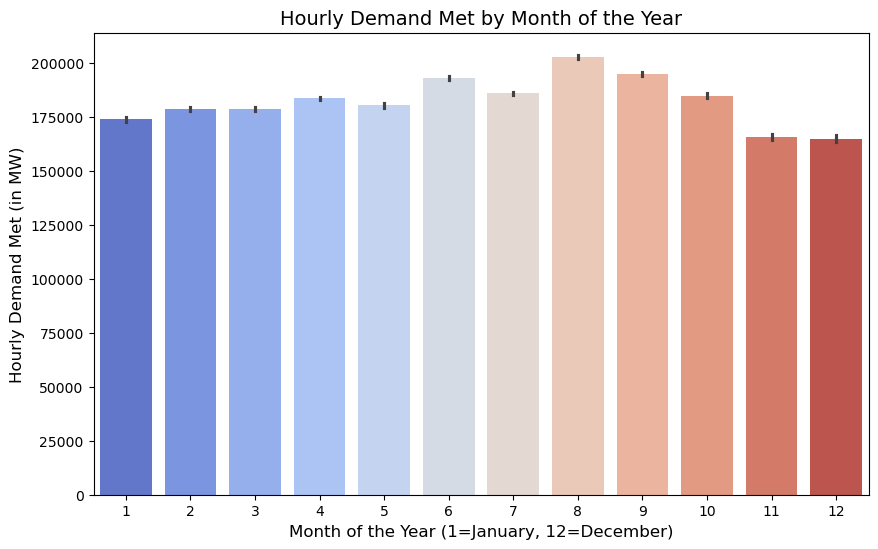

In [12]:
# Plotting Hourly Demand Met across months
plt.figure(figsize=(10, 6))
sns.barplot(x='month', y='Hourly Demand Met (in MW)', data=df, palette='coolwarm')
plt.title('Hourly Demand Met by Month of the Year', fontsize=14)
plt.xlabel('Month of the Year (1=January, 12=December)', fontsize=12)
plt.ylabel('Hourly Demand Met (in MW)', fontsize=12)
plt.xticks(rotation=0)
plt.show()


#### 4.2 Boxplot for Monthly data

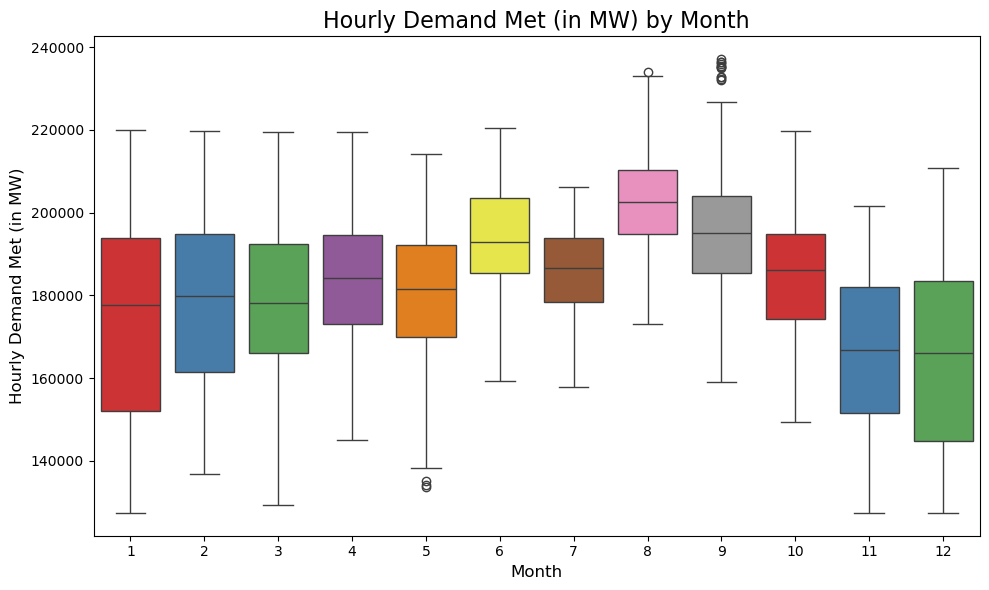

In [13]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='month', y='Hourly Demand Met (in MW)', data=df, palette="Set1")
plt.title('Hourly Demand Met (in MW) by Month', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Hourly Demand Met (in MW)', fontsize=12)
plt.tight_layout()
plt.show()

#### 4.3 Comparative Monthly Demand Line Chart

In [14]:
df['month_name'] = df['datetime'].dt.strftime('%b')
monthly_avg = df.groupby('month_name')['Hourly Demand Met (in MW)'].mean()

fig = go.Figure(go.Scatter(
    x=monthly_avg.index, y=monthly_avg.values,
    mode='lines+markers', name='Monthly Avg Demand',
    line=dict(color='purple', width=3)
))

fig.update_layout(
    title="Average Demand per Month",
    xaxis_title="Month",
    yaxis_title="Demand (MW)",
    template="plotly_white"
)

fig.show()


#### 5. Quarterly Analysis

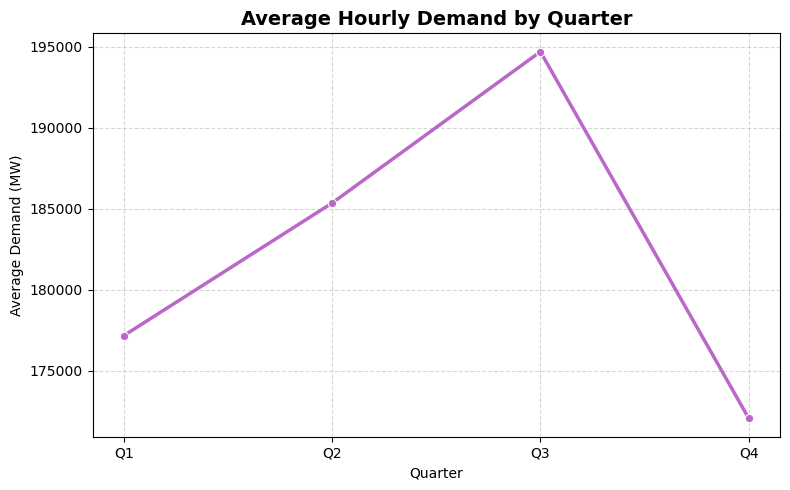

In [15]:
# Calculate average demand per quarter
avg_demand_by_quarter = df.groupby('quarter')['Hourly Demand Met (in MW)'].mean().reset_index()

# Plotting
plt.figure(figsize=(8,5))
sns.lineplot(data=avg_demand_by_quarter, x='quarter', y='Hourly Demand Met (in MW)', marker='o', linewidth=2.5, color='#BA68C8')
plt.title('Average Hourly Demand by Quarter', fontsize=14, weight='bold')
plt.xlabel('Quarter')
plt.ylabel('Average Demand (MW)')
plt.xticks([1, 2, 3, 4], ['Q1', 'Q2', 'Q3', 'Q4'])
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

#### 6. Visualizing Demand Across Seasons

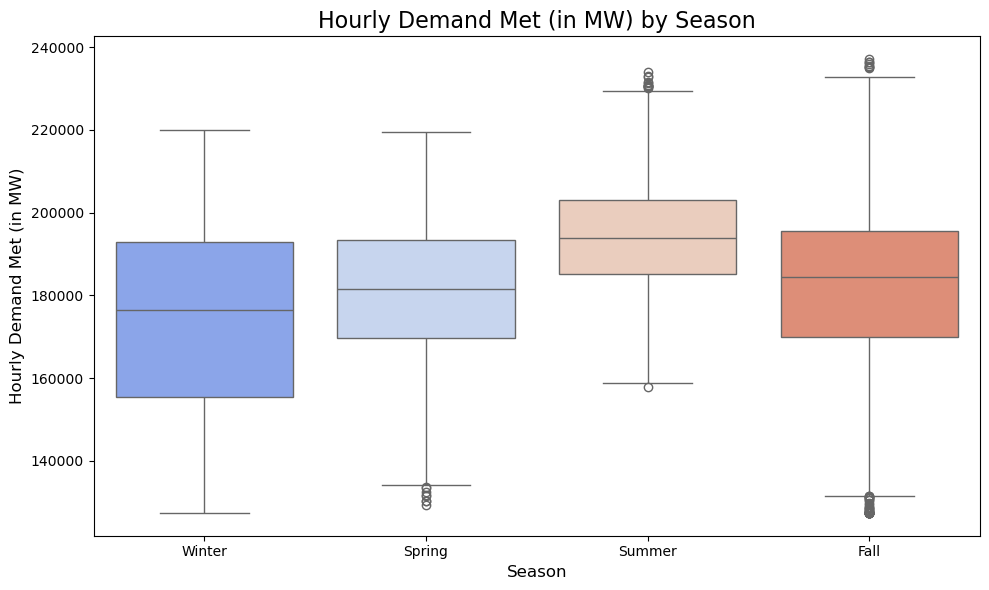

In [16]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='season', y='Hourly Demand Met (in MW)', data=df, palette="coolwarm")
plt.title('Hourly Demand Met (in MW) by Season', fontsize=16)
plt.xlabel('Season', fontsize=12)
plt.ylabel('Hourly Demand Met (in MW)', fontsize=12)
plt.tight_layout()
plt.show()

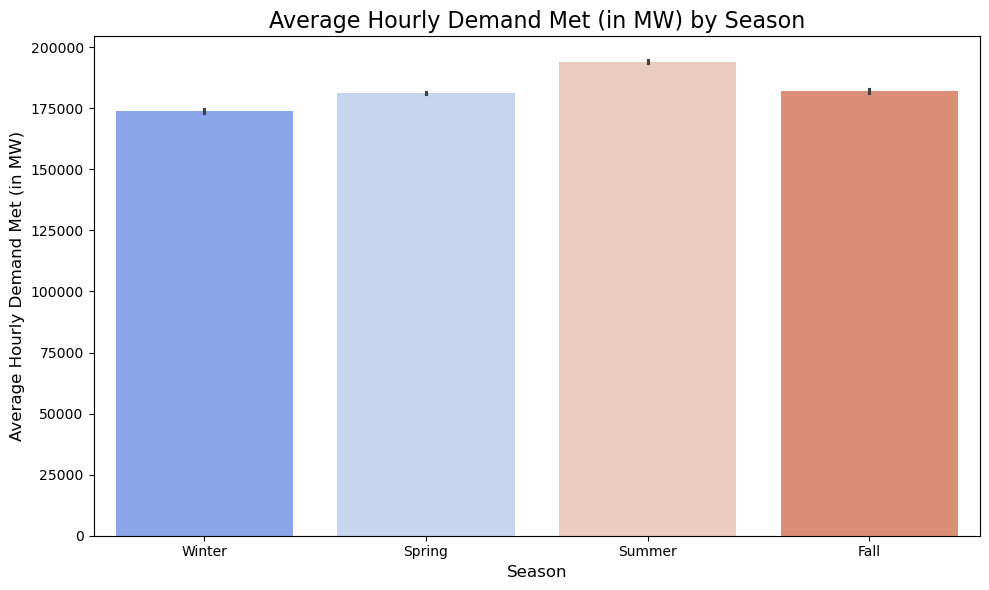

In [17]:
plt.figure(figsize=(10, 6))
sns.barplot(x='season', y='Hourly Demand Met (in MW)', data=df, palette="coolwarm")
plt.title('Average Hourly Demand Met (in MW) by Season', fontsize=16)
plt.xlabel('Season', fontsize=12)
plt.ylabel('Average Hourly Demand Met (in MW)', fontsize=12)
plt.tight_layout()
plt.show()


#### 7. Temporal Variation in Energy Demand across different Seasons

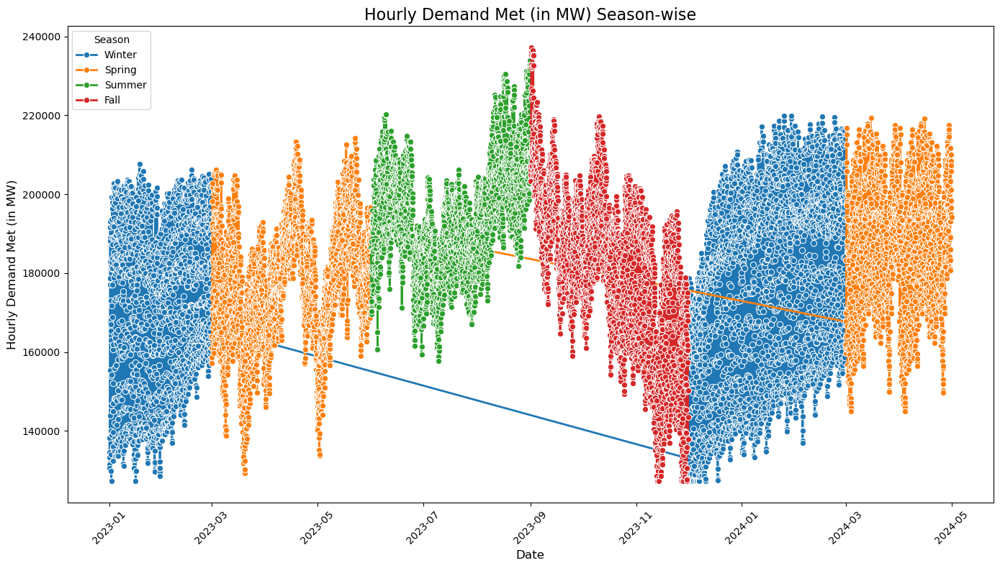

In [18]:
plt.figure(figsize=(14, 8))

# Create a line plot grouped by season
sns.lineplot(data=df, x='datetime', y='Hourly Demand Met (in MW)', hue='season', marker='o', linewidth=2)

# Add titles and labels
plt.title('Hourly Demand Met (in MW) Season-wise', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Hourly Demand Met (in MW)', fontsize=12)

# Set the plot formatting to show dates clearly
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(title='Season', loc='upper left')

# Show the plot
plt.show()


#### 🌦️ Seasonal Energy Demand Insights (Hourly Demand Met in MW)   
#### Winter Demand Dip:
Demand during winter months is generally lower and shows a steady decline, possibly due to reduced cooling requirements and shorter daylight hours.

#### Spring Surge & Spikes:
Spring exhibits a sharp increase in demand, with noticeable high-frequency fluctuations. This transition season likely reflects varied heating/cooling usage and unpredictable weather.

#### Summer Peaks Dominate:
Summer months record the highest and most consistent energy demand, with clear peak loads—unsurprising, given the reliance on air conditioning systems.

#### Fall Flattening:
Fall shows a gradual decline from summer peaks but still maintains relatively elevated demand, suggesting lagging residual heat or increased usage post-summer.

#### 📉 Overall Trends:
Each season forms a distinct cluster of behavior, with visible patterns of periodic demand spikes and dips, validating the impact of seasonality on power consumption.

#### 📊 Visual Separation:
The clean separation of seasonal colors makes it easy to observe transition zones, showing how energy needs evolve through the year.

#### 8. Seasonal Patterns with Hour of the Day

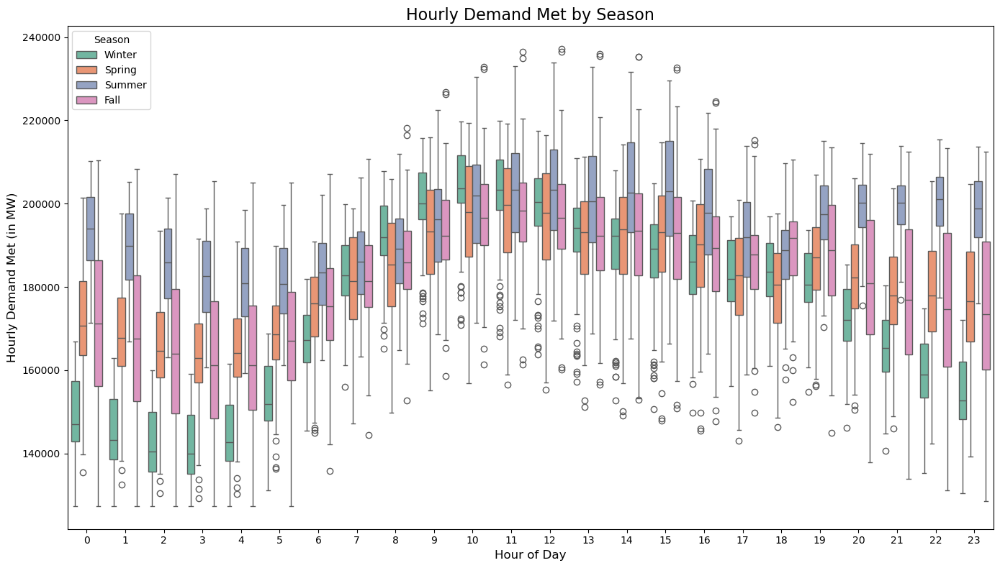

In [19]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='hour', y='Hourly Demand Met (in MW)', hue='season', palette='Set2')

# Add titles and labels
plt.title('Hourly Demand Met by Season', fontsize=16)
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Hourly Demand Met (in MW)', fontsize=12)
plt.tight_layout()
plt.legend(title='Season', loc='upper left')
plt.show()


#### 9. Seasonal Demand across different days of the week

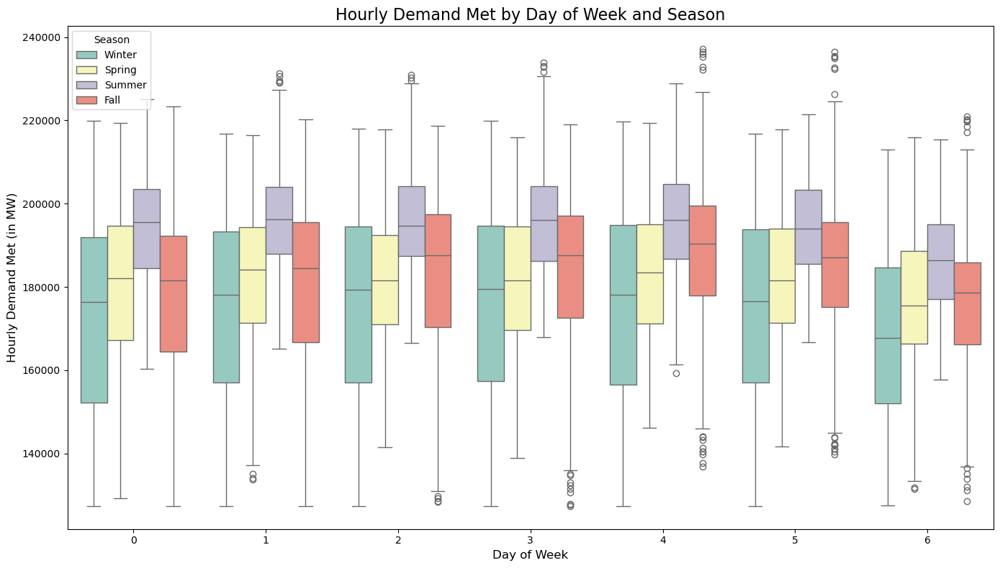

In [20]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='dayofweek', y='Hourly Demand Met (in MW)', hue='season', palette='Set3')

# Add titles and labels
plt.title('Hourly Demand Met by Day of Week and Season', fontsize=16)
plt.xlabel('Day of Week', fontsize=12)
plt.ylabel('Hourly Demand Met (in MW)', fontsize=12)
plt.tight_layout()
plt.legend(title='Season', loc='upper left')
plt.show()


#### 10. Comparing Energy Demand between Weekdays and Weekends

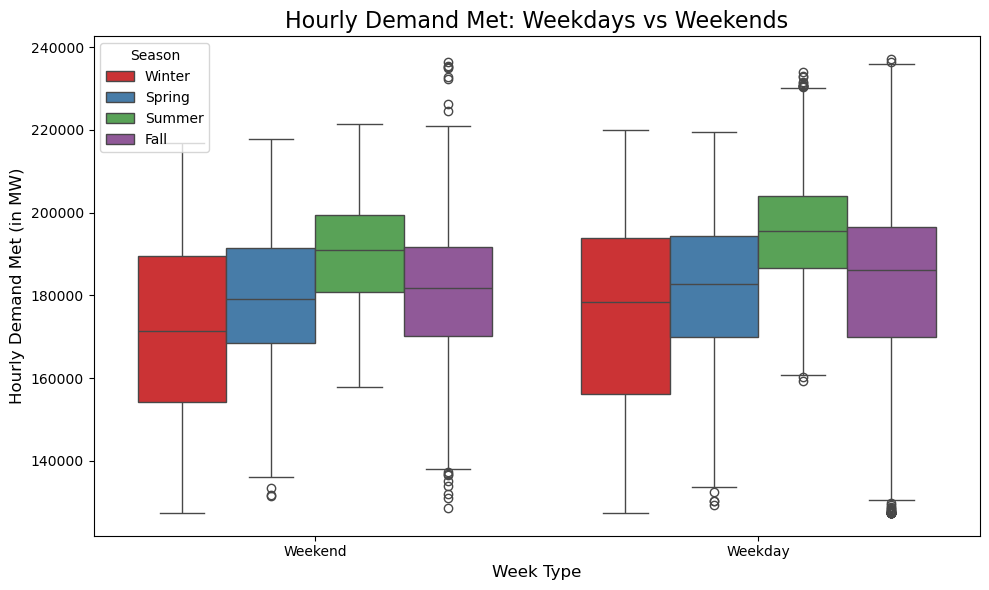

In [21]:
# Create a new feature to classify weekdays and weekends
df['week_type'] = df['dayofweek'].apply(lambda x: 'Weekend' if x >= 5 else 'Weekday')

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='week_type', y='Hourly Demand Met (in MW)', hue='season', palette='Set1')

# Add titles and labels
plt.title('Hourly Demand Met: Weekdays vs Weekends', fontsize=16)
plt.xlabel('Week Type', fontsize=12)
plt.ylabel('Hourly Demand Met (in MW)', fontsize=12)
plt.tight_layout()
plt.legend(title='Season', loc='upper left')
plt.show()


#### 11. Monthly Energy Demand Comparison

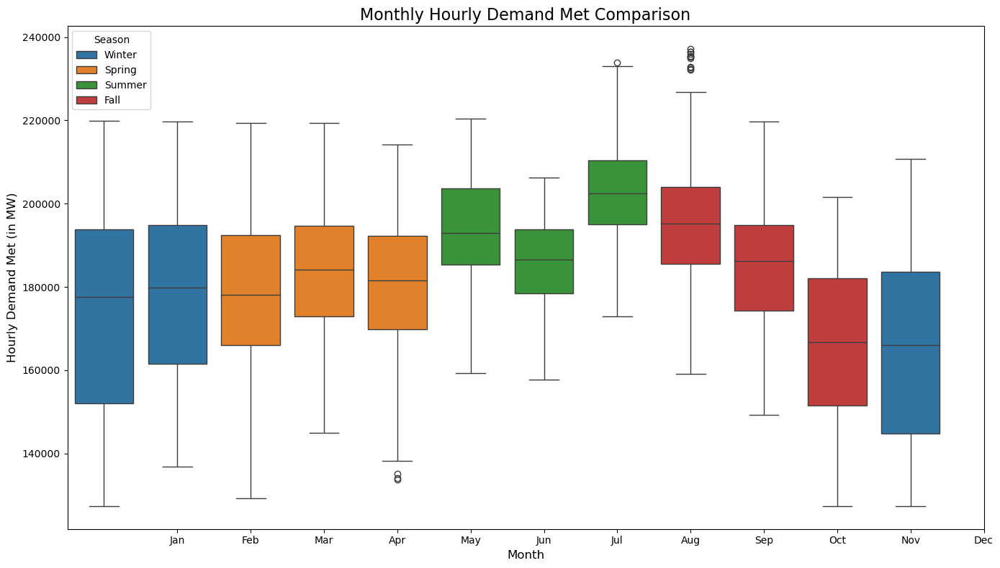

In [22]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='month', y='Hourly Demand Met (in MW)', hue='season')

# Add titles and labels
plt.title('Monthly Hourly Demand Met Comparison', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Hourly Demand Met (in MW)', fontsize=12)
plt.xticks(range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.tight_layout()
plt.legend(title='Season', loc='upper left')
plt.show()

#### 12. Energy Demand and Weather Conditions: Exploring the Relationship
#### 12.1 Energy Demand vs. Temperature

In [23]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df['datetime'], y=df['Hourly Demand Met (in MW)'],
    name='Demand (MW)', line=dict(color='royalblue')
))

fig.add_trace(go.Scatter(
    x=df['datetime'], y=df['temp'],
    name='Temperature (°C)', line=dict(color='crimson', dash='dot'),
    yaxis='y2'
))

fig.update_layout(
    title='Demand vs Temperature Over Time',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Demand (MW)'),
    yaxis2=dict(title='Temperature (°C)', overlaying='y', side='right'),
    template='plotly_white',
    height=500
)

fig.show()


#### Energy Demand vs Temperature: Critical Observations
1. Strong Seasonal Correlation: There's a clear inverse U-shape in temperature across the year—peaking around July-August and dipping around January—which mirrors sharp changes in demand, confirming seasonal impact.

2. High Demand in Extremes: Energy demand increases significantly during both extremely hot (summer) and cold (winter) months, reflecting elevated usage of cooling and heating systems, respectively.

3. Mild Weather = Lower Demand: During spring and fall, when temperatures are milder (around 20°C), the demand drops slightly, indicating reduced dependence on HVAC systems.

4. Winter Demand Rise Despite Low Temps: Despite falling temperatures (below 10°C), demand during December–January remains relatively high, supporting the heating load hypothesis.

5. Sharp Dips in Mid-2023: Some sharp troughs in demand during mid-2023 (June–July) despite rising temperatures could suggest external disruptions like public holidays or load shedding.

6. Demand Stability Post-Winter: Starting early 2024, demand shows a more stable and elevated baseline, possibly due to sustained energy needs or economic activity.

<Figure size 800x600 with 0 Axes>

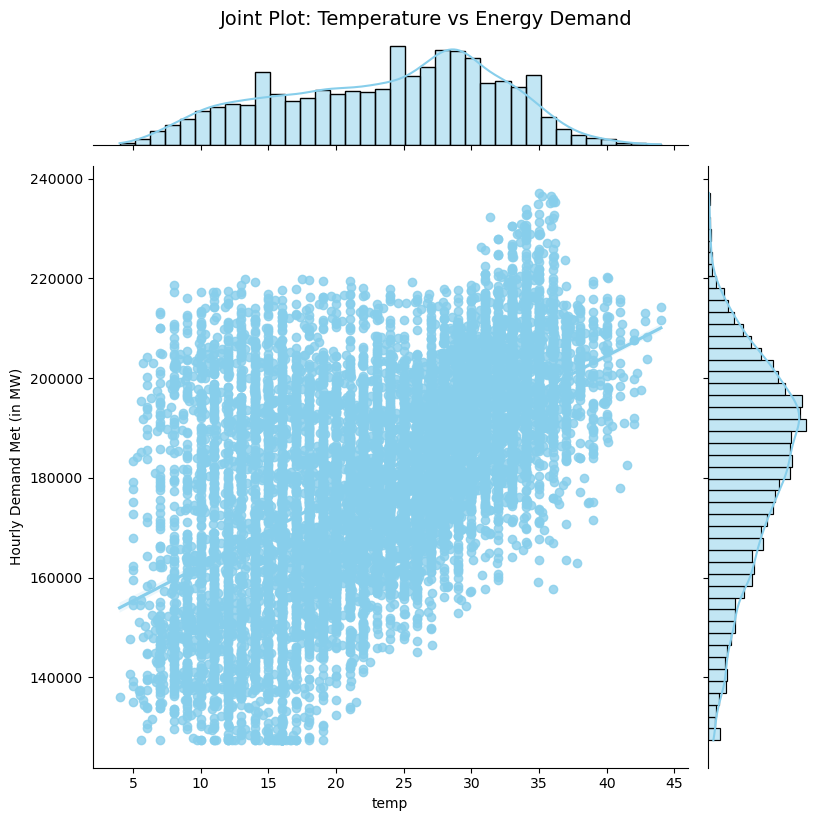

In [24]:
plt.figure(figsize=(8, 6))
sns.jointplot(data=df, x='temp', y='Hourly Demand Met (in MW)', kind='reg', height=8, color='skyblue')
plt.suptitle('Joint Plot: Temperature vs Energy Demand', fontsize=14, y=1.02)
plt.show()

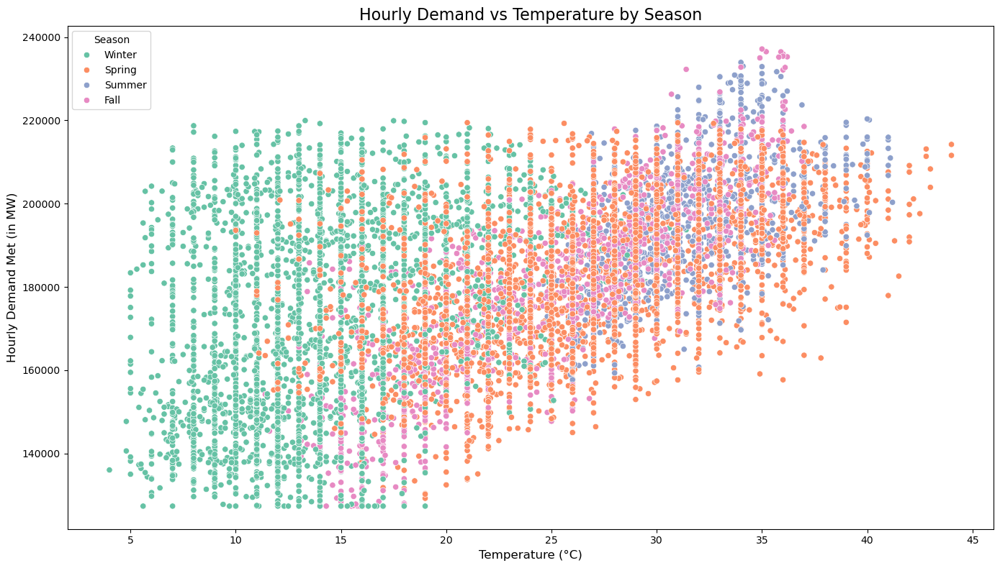

In [25]:
plt.figure(figsize=(14, 8))
sns.scatterplot(data=df, x='temp', y='Hourly Demand Met (in MW)', hue='season', palette='Set2')

# Add titles and labels
plt.title('Hourly Demand vs Temperature by Season', fontsize=16)
plt.xlabel('Temperature (°C)', fontsize=12)
plt.ylabel('Hourly Demand Met (in MW)', fontsize=12)
plt.tight_layout()
plt.legend(title='Season', loc='upper left')
plt.show()


#### 12.2 Energy Demand vs. Humidity

In [26]:
fig = go.Figure()

# Humidity trace
fig.add_trace(go.Scatter(
    x=df['datetime'],
    y=df['humidity'],
    name='Humidity (%)',
    mode='lines',
    line=dict(color='royalblue', width=2),
    yaxis='y1'
))

# Energy Demand trace
fig.add_trace(go.Scatter(
    x=df['datetime'],
    y=df['Hourly Demand Met (in MW)'],
    name='Energy Demand (MW)',
    mode='lines',
    line=dict(color='darkgreen', width=2, dash='dash'),
    yaxis='y2'
))

# Layout for dual y-axes
fig.update_layout(
    title='🌦️ Humidity vs Energy Demand Over Time',
    xaxis=dict(title='Date'),
    
    yaxis=dict(
        title='Humidity (%)',
        titlefont=dict(color='royalblue'),
        tickfont=dict(color='royalblue'),
    ),
    
    yaxis2=dict(
        title='Energy Demand (MW)',
        titlefont=dict(color='darkgreen'),
        tickfont=dict(color='darkgreen'),
        overlaying='y',
        side='right'
    ),
    
    legend=dict(x=0.01, y=0.99, bgcolor='rgba(255,255,255,0.5)', bordercolor='black'),
    template='plotly_white',
    height=500
)

fig.show()


#### Humidity vs Energy Demand: Key Insights
1.  Humidity Peaks 🌦️ Align With Monsoon: Humidity consistently spikes around June to September, indicating monsoon season, with values reaching close to 100% during this period.

2. Demand Doesn’t Always Rise with Humidity: Unlike temperature, there is no direct, consistent correlation between humidity and energy demand. Demand remains moderate to high, even as humidity fluctuates.

3. Possible Indirect Influence: High humidity combined with high temperature in mid-2023 seems to contribute to slightly higher demand, suggesting increased use of air conditioning in humid heat.

4. Dry Winter, Stable Demand: During winter (Dec–Feb) when humidity is lower, energy demand remains fairly stable to high, indicating humidity isn’t a strong standalone driver of demand.

5. Sudden Humidity Drops: Noticeable dips in humidity around April and October do not appear to affect energy demand significantly, again reinforcing weak correlation.

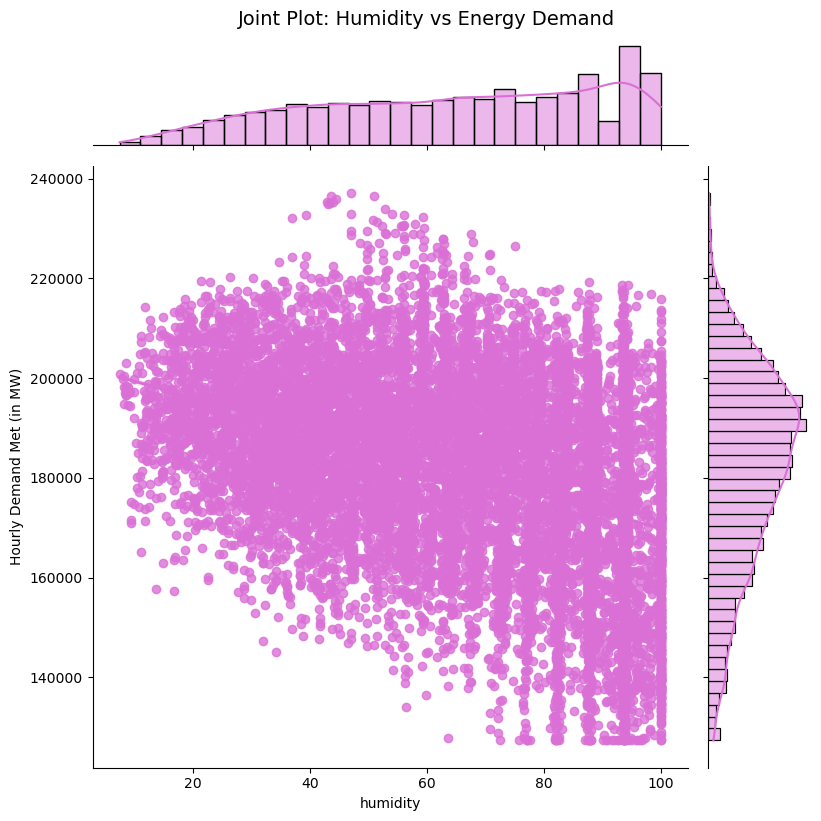

In [27]:
sns.jointplot(data=df, x='humidity', y='Hourly Demand Met (in MW)', kind='reg', height=8, color='orchid')
plt.suptitle('Joint Plot: Humidity vs Energy Demand', fontsize=14, y=1.02)
plt.show()


#### 12.3 Temperature vs. Humidity

In [28]:
fig = go.Figure()

# Temperature trace
fig.add_trace(go.Scatter(
    x=df['datetime'], 
    y=df['temp'], 
    name='Temperature (°C)', 
    mode='lines',
    line=dict(color='firebrick', width=2),
    yaxis='y1'
))

# Humidity trace
fig.add_trace(go.Scatter(
    x=df['datetime'], 
    y=df['humidity'], 
    name='Humidity (%)', 
    mode='lines',
    line=dict(color='royalblue', width=2, dash='dot'),
    yaxis='y2'
))

# Layout with dual y-axis
fig.update_layout(
    title='📈 Temperature and Humidity Over Time',
    xaxis=dict(title='Date'),
    yaxis=dict(
        title='Temperature (°C)',
        titlefont=dict(color='firebrick'),
        tickfont=dict(color='firebrick')
    ),
    yaxis2=dict(
        title='Humidity (%)',
        titlefont=dict(color='royalblue'),
        tickfont=dict(color='royalblue'),
        overlaying='y',
        side='right'
    ),
    legend=dict(x=0.01, y=0.99, bgcolor='rgba(255,255,255,0.5)', bordercolor='black'),
    template='plotly_white',
    height=500
)

fig.show()


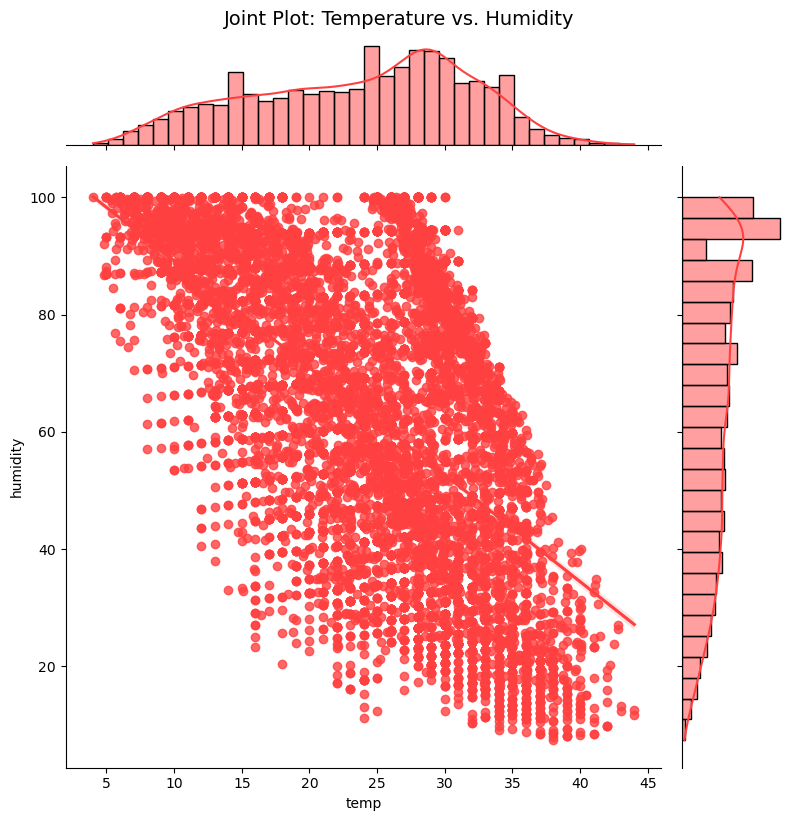

In [29]:
sns.jointplot(data=df, x='temp', y='humidity', kind='reg', height=8, color=(1.0,0.25,0.25))
plt.suptitle('Joint Plot: Temperature vs. Humidity', fontsize=14, y=1.02)
plt.show()


#### 12.4 Energy Demand vs. Temperature and Humidity

In [30]:
fig = go.Figure()

# Temperature Trace
fig.add_trace(go.Scatter(
    x=df['datetime'],
    y=df['temp'],
    name='Temperature (°C)',
    mode='lines',
    line=dict(color='firebrick', width=2),
    yaxis='y1'
))

# Humidity Trace
fig.add_trace(go.Scatter(
    x=df['datetime'],
    y=df['humidity'],
    name='Humidity (%)',
    mode='lines',
    line=dict(color='royalblue', width=2, dash='dot'),
    yaxis='y2'
))

# Energy Demand Trace
fig.add_trace(go.Scatter(
    x=df['datetime'],
    y=df['Hourly Demand Met (in MW)'],
    name='Energy Demand (MW)',
    mode='lines',
    line=dict(color='darkgreen', width=2, dash='dashdot'),
    yaxis='y3'
))

# Layout for 3 axes
fig.update_layout(
    title='📊 Temperature, Humidity & Energy Demand Over Time',
    xaxis=dict(title='Date'),
    
    yaxis=dict(
        title='Temperature (°C)',
        titlefont=dict(color='firebrick'),
        tickfont=dict(color='firebrick'),
        anchor='free',
        position=0
    ),
    
    yaxis2=dict(
        title='Humidity (%)',
        titlefont=dict(color='royalblue'),
        tickfont=dict(color='royalblue'),
        overlaying='y',
        side='right'
    ),
    
    yaxis3=dict(
        title='Energy Demand (MW)',
        titlefont=dict(color='teal'),
        tickfont=dict(color='teal'),
        anchor='x',
        overlaying='y',
        side='left',
        position=0.05
    ),
    
    legend=dict(x=0.01, y=0.99, bgcolor='rgba(255,255,255,0.5)', bordercolor='black'),
    template='plotly_white',
    height=550
)

fig.show()


#### 12.5 Energy Demand vs. Wind Speed

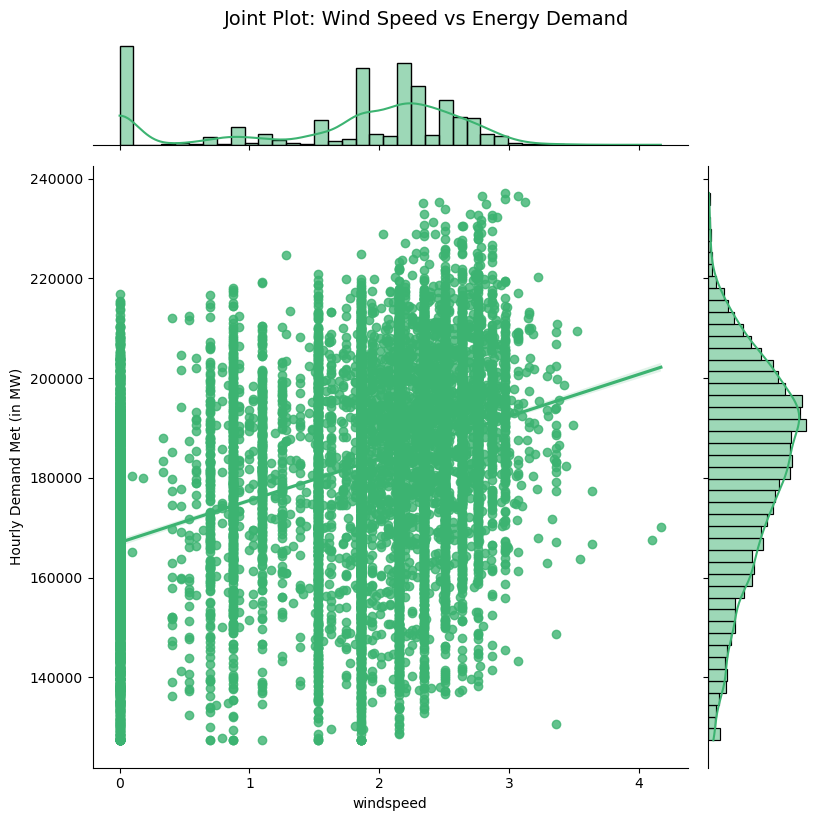

In [31]:
sns.jointplot(data=df, x='windspeed', y='Hourly Demand Met (in MW)', kind='reg', height=8, color='mediumseagreen')
plt.suptitle('Joint Plot: Wind Speed vs Energy Demand', fontsize=14, y=1.02)
plt.show()


#### 13. Correlation Heatmap

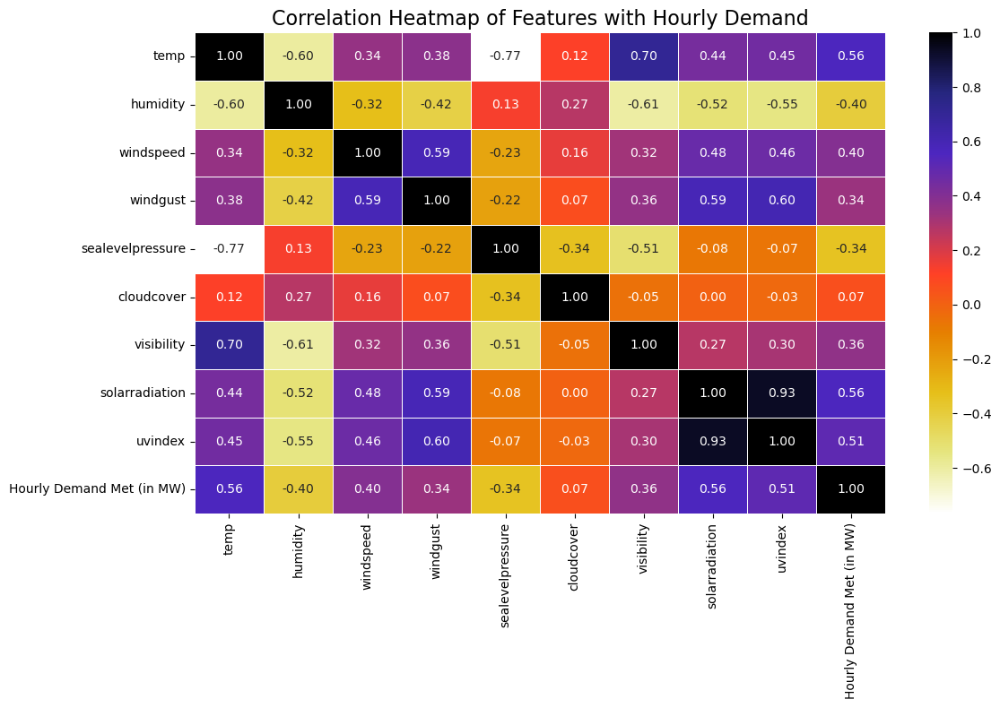

In [32]:
# Calculate correlation matrix
corr_matrix = df[['temp', 'humidity', 'windspeed', 'windgust', 'sealevelpressure', 'cloudcover', 'visibility', 'solarradiation', 'uvindex', 'Hourly Demand Met (in MW)']].corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='CMRmap_r', fmt='.2f', linewidths=0.5)

# Add titles
plt.title('Correlation Heatmap of Features with Hourly Demand', fontsize=16)
plt.tight_layout()
plt.show()


### 14. Rolling Mean Smoothing

<div style="background-color:#e8f5e9; padding: 16px; border-left: 5px solid #66bb6a; border-radius: 8px; font-size: 16px">

**Rolling Mean (or Moving Average)** helps in reducing noise from the time series data by taking the average of data points over a defined window. It helps in identifying **trends** and **seasonal patterns** more clearly.
</div>

####  Mathematical Formula
Let $ y_t $ be the original value at time $ t $, and $ w $ be the window size. Then the Rolling Mean at time $ t $ is:

$$
\text{RollingMean}_t = \frac{1}{w} \sum_{i=t-w+1}^{t} y_i
$$


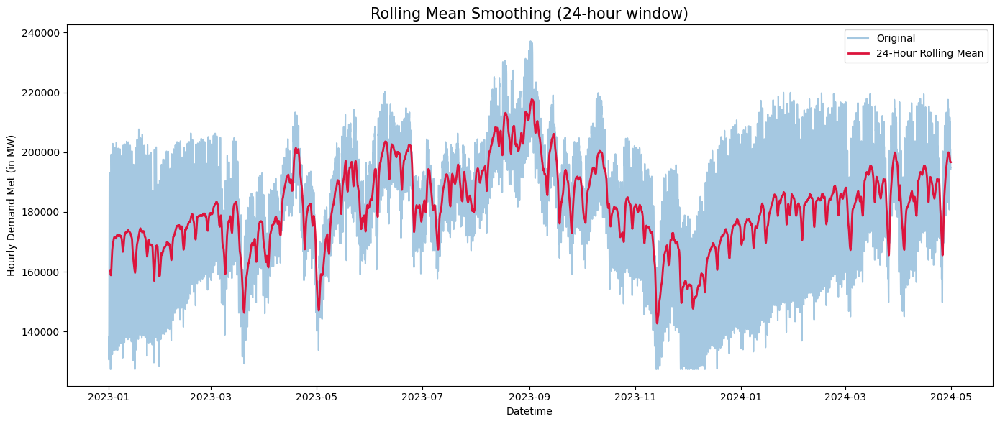

In [33]:
# Apply a 24-hour rolling mean (can be adjusted)
df['rolling_mean_24hr'] = df['Hourly Demand Met (in MW)'].rolling(window=24).mean()

# Plot the original vs smoothed data
plt.figure(figsize=(14, 6))
plt.plot(df['datetime'], df['Hourly Demand Met (in MW)'], label='Original', alpha=0.4)
plt.plot(df['datetime'], df['rolling_mean_24hr'], label='24-Hour Rolling Mean', color='crimson', linewidth=2)
plt.title('Rolling Mean Smoothing (24-hour window)', fontsize=15)
plt.xlabel('Datetime')
plt.ylabel('Hourly Demand Met (in MW)')
plt.legend()
plt.tight_layout()
plt.show()

## 15. Lag Features & Rolling Statistics

<div style="background-color:#fffde7; padding: 16px; border-left: 5px solid #fbc02d; border-radius: 8px; font-size: 16px">
  Lag features and rolling statistics are crucial for capturing temporal dependencies in time series data. By adding lag features, we are essentially creating new columns that represent the previous time steps (e.g., previous hour, previous day) in the dataset. Similarly, rolling statistics (like rolling mean, rolling standard deviation) are used to capture short-term fluctuations and smooth trends.
</div>

### 15.1 Lag Features

<div style="font-size: 16px">
    
A **lag feature** is a value of the target variable (or another feature) from a previous time step. Lag features are useful when past values have a strong relationship with the current or future target variable.

#### 📈 Mathematical Formula for Lag Feature

Given a time series $ y_t $, a lag feature at time $ t $ with a lag of $ n $ is defined as:

$$
\text{Lag}_n = y_{t-n}
$$

</div>

In [34]:
# Create lag features: 1-hour, 24-hour (1-day), and 168-hour (7-day)
df['lag_1'] = df['Hourly Demand Met (in MW)'].shift(1)      # 1-hour lag
df['lag_24'] = df['Hourly Demand Met (in MW)'].shift(24)    # 24-hour lag
df['lag_168'] = df['Hourly Demand Met (in MW)'].shift(168)  # 7-day lag (24 * 7)

# Preview the lagged features
df[['datetime', 'Hourly Demand Met (in MW)', 'lag_1', 'lag_24', 'lag_168']].head(30)


,datetime,Hourly Demand Met (in MW),lag_1,lag_24,lag_168
0,2023-01-01 00:00:00,138212.800,NaN,NaN,NaN
1,2023-01-01 01:00:00,134620.740,138212.800,NaN,NaN
2,2023-01-01 02:00:00,131384.790,134620.740,NaN,NaN
3,2023-01-01 03:00:00,130602.470,131384.790,NaN,NaN
4,2023-01-01 04:00:00,133288.970,130602.470,NaN,NaN
5,2023-01-01 05:00:00,143888.710,133288.970,NaN,NaN
6,2023-01-01 06:00:00,155446.310,143888.710,NaN,NaN
7,2023-01-01 07:00:00,167779.450,155446.310,NaN,NaN
8,2023-01-01 08:00:00,178771.140,167779.450,NaN,NaN
9,2023-01-01 09:00:00,188824.250,178771.140,NaN,NaN


### 15.2 Rolling Statistics

<div style="background-color:#fffde7; padding: 16px; border-left: 5px solid #fbc02d; border-radius: 8px; font-size: 16px">
  Rolling statistics help summarize the data over a moving window, giving a clearer view of trends and variations over time.
</div>

#### 📈 Mathematical Formula for Rolling Mean & Rolling Standard Deviation

<div style="font-size: 16px;">

**Rolling Mean** at time $ t $ with window size $ w $:

$$
\text{RollingMean}_t = \frac{1}{w} \sum_{i=t-w+1}^{t} y_i
$$

**Rolling Standard Deviation** at time \( t \) with window size \( w \):

$$
\text{RollingStd}_t = \sqrt{ \frac{1}{w} \sum_{i=t-w+1}^{t} \left( y_i - \text{RollingMean}_t \right)^2 }
$$

</div>


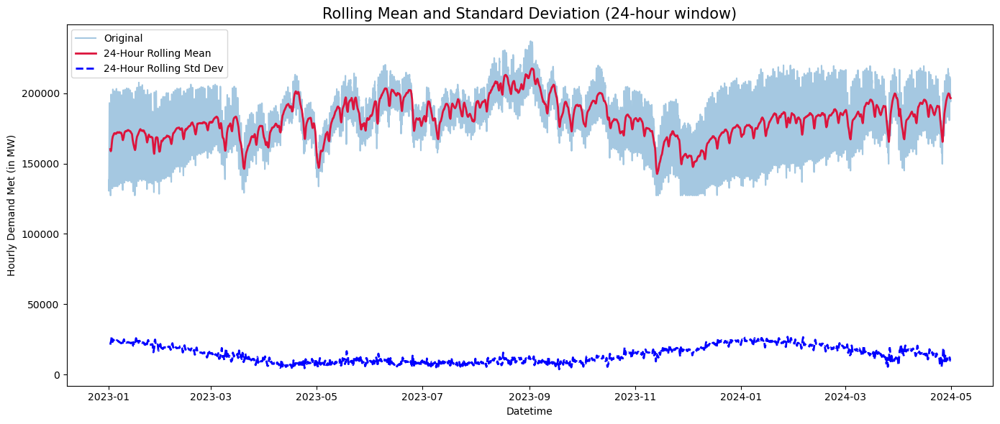

In [35]:
# Apply rolling mean and rolling standard deviation (e.g., 24-hour window)
df['rolling_mean_24hr'] = df['Hourly Demand Met (in MW)'].rolling(window=24).mean()
df['rolling_std_24hr'] = df['Hourly Demand Met (in MW)'].rolling(window=24).std()

# Plot the rolling statistics
plt.figure(figsize=(14, 6))
plt.plot(df['datetime'], df['Hourly Demand Met (in MW)'], label='Original', alpha=0.4)
plt.plot(df['datetime'], df['rolling_mean_24hr'], label='24-Hour Rolling Mean', color='crimson', linewidth=2)
plt.plot(df['datetime'], df['rolling_std_24hr'], label='24-Hour Rolling Std Dev', color='blue', linestyle='--', linewidth=2)
plt.title('Rolling Mean and Standard Deviation (24-hour window)', fontsize=15)
plt.xlabel('Datetime')
plt.ylabel('Hourly Demand Met (in MW)')
plt.legend()
plt.tight_layout()
plt.show()


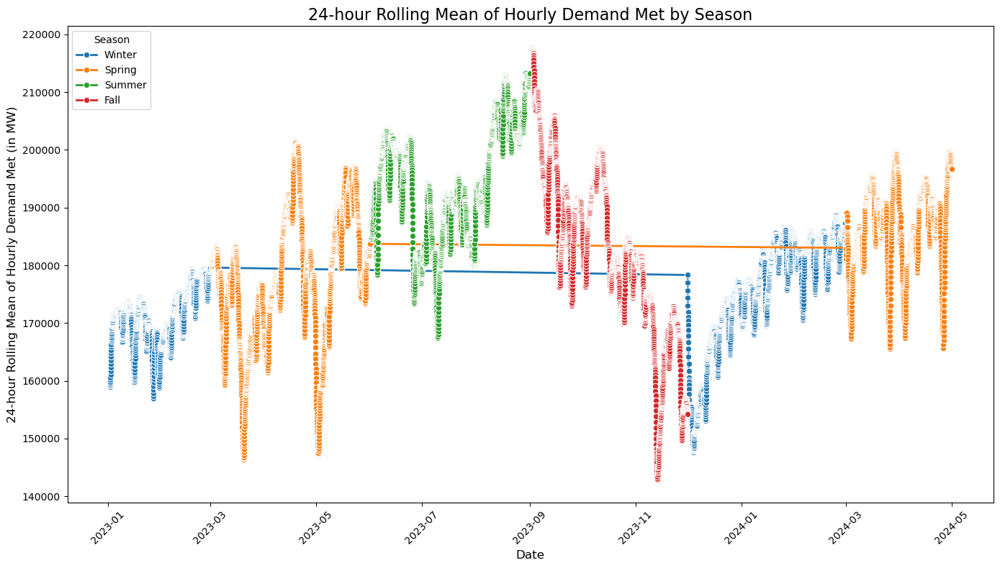

In [36]:
# Calculate 24-hour rolling mean for smoothing the data
df['rolling_mean'] = df.groupby('season')['Hourly Demand Met (in MW)'].rolling(window=24).mean().reset_index(0, drop=True)

plt.figure(figsize=(14, 8))
sns.lineplot(data=df, x='datetime', y='rolling_mean', hue='season', marker='o', linewidth=2)

# Add titles and labels
plt.title('24-hour Rolling Mean of Hourly Demand Met by Season', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('24-hour Rolling Mean of Hourly Demand Met (in MW)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(title='Season', loc='upper left')
plt.show()


In [37]:
df.head()

,Hourly Demand Met (in MW),datetime,temp,dew,humidity,windgust,windspeed,sealevelpressure,cloudcover,visibility,...,weekofyear,season,month_name,week_type,rolling_mean_24hr,lag_1,lag_24,lag_168,rolling_std_24hr,rolling_mean
0,138212.80,2023-01-01 00:00:00,11.0,10.0,93.55,2.639057,1.856298,1020.0,0.0,1.098612,...,52,Winter,Jan,Weekend,NaN,NaN,NaN,NaN,NaN,NaN
1,134620.74,2023-01-01 01:00:00,10.0,9.0,93.50,2.660260,1.856298,1020.0,0.0,1.098612,...,52,Winter,Jan,Weekend,NaN,138212.80,NaN,NaN,NaN,NaN
2,131384.79,2023-01-01 02:00:00,8.6,7.6,93.83,2.660260,0.000000,1019.5,0.0,0.788457,...,52,Winter,Jan,Weekend,NaN,134620.74,NaN,NaN,NaN,NaN
3,130602.47,2023-01-01 03:00:00,10.0,9.0,93.50,2.687847,0.000000,1019.0,0.0,1.098612,...,52,Winter,Jan,Weekend,NaN,131384.79,NaN,NaN,NaN,NaN
4,133288.97,2023-01-01 04:00:00,9.0,9.0,100.00,2.580217,1.856298,1019.0,0.0,0.693147,...,52,Winter,Jan,Weekend,NaN,130602.47,NaN,NaN,NaN,NaN


In [38]:
df.shape

(11664, 31)

#### Identifying Categorical Time-Based Features

In [39]:
# Identify object-type columns (potential categorical features)
categorical_features = df.select_dtypes(include='object').columns.tolist()

print("Categorical features detected:", categorical_features)

Categorical features detected: ['season', 'month_name', 'week_type']


<div style="background-color:#dcd0ff; padding: 10px; border-radius: 6px; text-align: center;">
  <h3 style="color: 4b0082; margin: 0;">One-Hot Encoding of Categorical Time-Based Features</h3>
</div>

To prepare our dataset for model training, we need to convert categorical variables into a numerical format.

Since features like `season`, `month_name`, and `week_type` are nominal (they don't have an inherent order), we apply **One-Hot Encoding** to represent each category as an individual binary feature. This transformation helps our model understand categorical patterns without assuming any ordinal relationship.

We also use `drop_first=True` to avoid multicollinearity, which can improve the performance and interpretability of regression models.

Let’s now encode the categorical variables to make the dataset model-ready. 


In [40]:
# One-hot encode the detected categorical features
model_data = pd.get_dummies(df, columns=categorical_features, drop_first=True)

print("Shape after encoding:", model_data.shape)

Shape after encoding: (11664, 43)


#### Why Did the Number of Columns Increase After One-Hot Encoding?

Even with `drop_first=True`, each categorical feature is replaced by `n - 1` binary (dummy) columns, where `n` is the number of unique categories in that feature.

Let's break it down:

| **Categorical Feature** | **Unique Values** | **New Columns (with `drop_first=True`)** |
|--------------------------|-------------------|-------------------------------------------|
| season                 | 4                 | 3                                         |
| week_type              | 2                 | 1                                         |
| month_name             | 12                | 11                                        |

So, if we apply One-Hot Encoding to these 3 features:

- We **drop** 3 original columns  
- We **add** 3 + 1 + 11 = 15 new binary columns

This leads to a **net increase of 12 columns** — which is **expected behavior**.

---

One-Hot Encoding makes categorical features interpretable for the model by representing each category as a separate binary feature — without implying any order or ranking. This transformation helps uncover **non-linear relationships and category-specific patterns**, making your model more powerful and insightful.


In [41]:
# Finally, save the dataset with the time-based features, to be fed into the model for training
model_data.to_csv('feature_engineered_data.csv', index=False)


In [42]:
df.shape

(11664, 31)

In [43]:
model_data.shape

(11664, 43)

In [44]:
model_data.head()

,Hourly Demand Met (in MW),datetime,temp,dew,humidity,windgust,windspeed,sealevelpressure,cloudcover,visibility,...,month_name_Feb,month_name_Jan,month_name_Jul,month_name_Jun,month_name_Mar,month_name_May,month_name_Nov,month_name_Oct,month_name_Sep,week_type_Weekend
0,138212.80,2023-01-01 00:00:00,11.0,10.0,93.55,2.639057,1.856298,1020.0,0.0,1.098612,...,False,True,False,False,False,False,False,False,False,True
1,134620.74,2023-01-01 01:00:00,10.0,9.0,93.50,2.660260,1.856298,1020.0,0.0,1.098612,...,False,True,False,False,False,False,False,False,False,True
2,131384.79,2023-01-01 02:00:00,8.6,7.6,93.83,2.660260,0.000000,1019.5,0.0,0.788457,...,False,True,False,False,False,False,False,False,False,True
3,130602.47,2023-01-01 03:00:00,10.0,9.0,93.50,2.687847,0.000000,1019.0,0.0,1.098612,...,False,True,False,False,False,False,False,False,False,True
4,133288.97,2023-01-01 04:00:00,9.0,9.0,100.00,2.580217,1.856298,1019.0,0.0,0.693147,...,False,True,False,False,False,False,False,False,False,True
